## BCycle Data Analysis

In the following notebook, we analyzed many asepects of Bcycle data from 2014-2018

Contributers: Anqing Chen, Nicholas Chu, Nikil Kolluri, Jason Gu


## Getting the data from Blob Storage
Our data is stored inside of Azure Blob Storage. 

In [1]:
from azure.storage.blob import BlockBlobService
import os

In [2]:
# You should only run this code once.
!mkdir bcycle

mkdir: cannot create directory ‘bcycle’: File exists


In [3]:
local_path=os.getcwd() + "/bcycle" # Where the data will be stored.
blob_account_name = "mldsdatahack2019diag" # Don't edit!
blob_account_key = "JsauBssnY92CeD3MgI2SWhkQ16JioJCRWVW8NzKtcWckI+DaNNbCmpmMAVq27GD91mhgH+oHPx+QbIKUCow5gA=="  # Don't edit!

mycontainer = "datahackdata2019"       # Don't edit!

In [4]:
import azure
from azure.storage.blob import BlockBlobService

# Create a client to get data
blob_service = BlockBlobService(account_name=blob_account_name, account_key=blob_account_key)
# Get the data
blob_service.get_blob_to_path("datahackdata2019", "BCycleAustin.csv", os.path.join(local_path, "BCycleAustin.csv"))

## Load Data

In [5]:
# Yo should see BCycleAustin.csv
!ls bcycle

BCycleAustin.csv


In [6]:
import pandas as pd
import matplotlib.pyplot as plt

In [7]:
# Read in data
df = pd.read_csv('bcycle/BCycleAustin.csv')

In [8]:
# See the first few rows.
df.head()

,Trip ID,Membership Type,Bicycle ID,Checkout Kiosk ID,Checkout Kiosk,Return Kiosk ID,Return Kiosk,Trip Duration Minutes,Checkout DateTime,Checkout Latitude,Checkout Longitude,Return Latitude,Return Longitude
0,9900285854,Annual (San Antonio B-cycle),207.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,76,2014-10-26 13:12:00,30.27041,-97.75046,30.25579,-97.73982
1,9900288020,24-Hour Kiosk (Austin B-cycle),190.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,12,2014-10-30 19:12:00,30.27041,-97.75046,30.25579,-97.73982
2,9900289011,Local365,190.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,9,2015-10-01 19:12:27,30.27041,-97.75046,30.25579,-97.73982
3,9900292552,Walk Up,354.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,14,2015-10-04 13:12:41,30.27041,-97.75046,30.25579,-97.73982
4,9900293709,Local365,20.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,11,2015-10-04 13:12:56,30.27041,-97.75046,30.25579,-97.73982


In [9]:
# Installing folium for nice map visualizations
!pip install folium

You are using pip version 9.0.3, however version 19.0.3 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [10]:
import folium

In [11]:
# first extract the kiosk locations
df_kiosks = df[['Checkout Kiosk','Checkout Latitude','Checkout Longitude']].drop_duplicates()
df_kiosks.reset_index(drop=True, inplace=True)
df_kiosks.head()

,Checkout Kiosk,Checkout Latitude,Checkout Longitude
0,West & 6th St.,30.27041,-97.75046
1,Convention Center / 4th St. @ MetroRail,30.26483,-97.73900
2,8th & Congress,30.26980,-97.74186
3,East 11th St. & San Marcos,30.26968,-97.73074
4,South Congress & Elizabeth,30.24891,-97.75019


In [12]:
# Creating a map of all kiosks
m = folium.Map(
    location=[df_kiosks['Checkout Latitude'].mean(),df_kiosks['Checkout Longitude'].mean()],
    zoom_start=14,
)

for i in range(len(df_kiosks)):
    folium.Marker([df_kiosks['Checkout Latitude'][i],df_kiosks['Checkout Longitude'][i]], 
                   tooltip = df_kiosks['Checkout Kiosk'][i]).add_to(m)
m

## Mapping Trajectories over a Single Month

Resource: https://deparkes.co.uk/2016/06/03/plot-lines-in-folium/

In [13]:
# Convert the checkout datetime from string to an actual date-time object.
df['Checkout DateTime'] = pd.to_datetime(df['Checkout DateTime'])
# extract year-month to bin for plot
df['Checkout YR-MO'] = pd.to_datetime(df['Checkout DateTime'].apply(lambda x :
                                                      str(x.year) + '-' + str(x.month)))
# All the cycles checked out in the same month are in the same group
groups = df.groupby(['Checkout YR-MO']).count()
# See first few columns
groups.head()

,Trip ID,Membership Type,Bicycle ID,Checkout Kiosk ID,Checkout Kiosk,Return Kiosk ID,Return Kiosk,Trip Duration Minutes,Checkout DateTime,Checkout Latitude,Checkout Longitude,Return Latitude,Return Longitude
Checkout YR-MO,,,,,,,,,,,,,
2013-12-01,1457,1457,1457,1457,1457,1457,1457,1457,1457,1457,1457,1457,1457
2014-01-01,3358,3358,3358,3358,3358,3358,3358,3358,3358,3358,3358,3358,3358
2014-02-01,5297,5297,5297,5297,5297,5297,5297,5297,5297,5297,5297,5297,5297
2014-03-01,23547,23547,23547,23547,23547,23547,23547,23547,23547,23547,23547,23547,23547
2014-04-01,12624,12624,12624,12624,12624,12624,12624,12624,12624,12624,12624,12624,12624


In [14]:
# Get all trajectories for checkout year/month 2014 october
df_mo = df[df['Checkout YR-MO'] == '2014-10-01']
df_mo.reset_index(inplace=True)
df_mo.head()

,index,Trip ID,Membership Type,Bicycle ID,Checkout Kiosk ID,Checkout Kiosk,Return Kiosk ID,Return Kiosk,Trip Duration Minutes,Checkout DateTime,Checkout Latitude,Checkout Longitude,Return Latitude,Return Longitude,Checkout YR-MO
0,0,9900285854,Annual (San Antonio B-cycle),207.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,76,2014-10-26 13:12:00,30.27041,-97.75046,30.25579,-97.73982,2014-10-01
1,1,9900288020,24-Hour Kiosk (Austin B-cycle),190.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,12,2014-10-30 19:12:00,30.27041,-97.75046,30.25579,-97.73982,2014-10-01
2,253,9900267860,Annual Membership (Austin B-cycle),772.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,15,2014-10-04 10:12:00,30.27041,-97.75046,30.25579,-97.73982,2014-10-01
3,254,9900267861,Annual Membership (Austin B-cycle),470.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,15,2014-10-04 10:12:00,30.27041,-97.75046,30.25579,-97.73982,2014-10-01
4,255,9900271774,24-Hour Kiosk (Austin B-cycle),961.0,2537.0,West & 6th St.,2707.0,Rainey St @ Cummings,54,2014-10-06 21:12:00,30.27041,-97.75046,30.25579,-97.73982,2014-10-01


In [15]:
# For checkout at a particular kiosk, how many trips to other kiosk?
df_counts = df_mo.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']
# print("Example:",df_counts[30.24891,-97.75019,30.24891,-97.75019])
# print("Max:",df_counts.max())
df_counts.head()

Checkout Latitude  Checkout Longitude  Return Latitude  Return Longitude
30.24891           -97.75019           30.24891         -97.75019           51
                                       30.25103         -97.74926            8
                                       30.25226         -97.74854           11
                                       30.25579         -97.73982           13
                                       30.25870         -97.74872           13
Name: Trip ID, dtype: int64

In [17]:
for i in range(len(df_counts)):
    checkout_lat, checkout_lon, return_lat, return_lon = df_counts.index[i]


In [18]:
df_kiosks['Checkout Latitude'].min(), df_kiosks['Checkout Latitude'].max()

(30.24258, 30.294390000000003)

In [19]:
m = folium.Map(
    location=[df_kiosks['Checkout Latitude'].mean(),df_kiosks['Checkout Longitude'].mean()],
    zoom_start=14,
    tiles='Stamen Terrain'
)

for i in range(len(df_counts)):
    start_lat, start_lon, end_lat, end_lon = df_counts.index[i]
    folium.PolyLine([(start_lat, start_lon),
                    (end_lat,end_lon)], color="red", weight=2.5, opacity=df_counts[i]/df_counts.max()).add_to(m)
m

### Follow Up:

Now do you think the trajectories change over time?

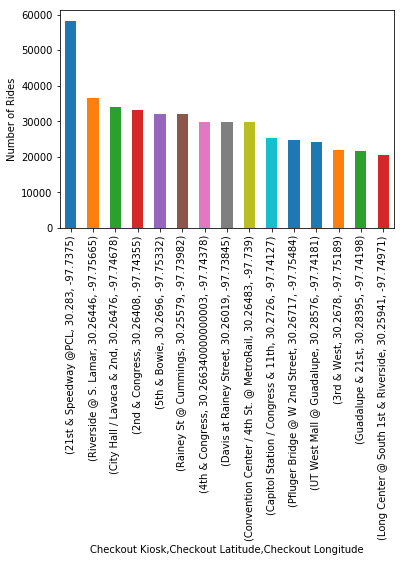

In [20]:
igroup = df.groupby(['Checkout Kiosk', 'Checkout Latitude', 'Checkout Longitude']).count()['Trip ID'].sort_values(ascending=False)
igroup = igroup.iloc[0:15]
igroup.head()
igroup.plot('bar')
plt.ylabel('Number of Rides')
plt.show()

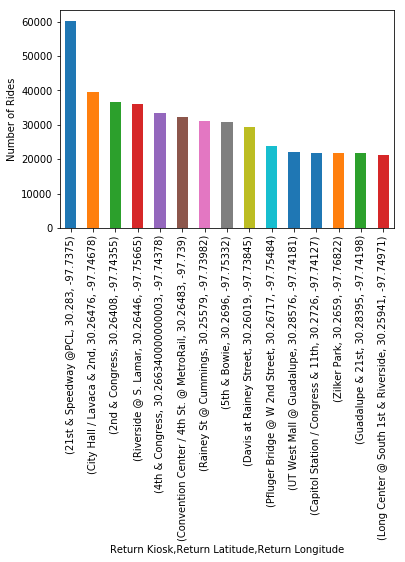

In [21]:
ogroup = df.groupby(['Return Kiosk', 'Return Latitude', 'Return Longitude']).count()['Trip ID'].sort_values(ascending=False)
ogroup = ogroup.iloc[0:15]
ogroup.head()
ogroup.plot('bar')
plt.ylabel('Number of Rides')
plt.show()

In [22]:
sumLong = 0
sumLat = 0

for i in range(len(igroup)):
    sumLong=sumLong + igroup.index[i][1]
    sumLat=sumLat + igroup.index[i][2]

meanLong = sumLong/len(igroup)
meanLat = sumLat/len(igroup)

m1 = folium.Map(
    location=[meanLong,meanLat],
    zoom_start=14,
)

for i in range(len(igroup)):
    markerRadius = igroup.values[i] / 1000
    folium.CircleMarker([igroup.index[i][1], igroup.index[i][2]], radius = markerRadius, color='#3186cc',
    fill=True, fill_color='#3186cc', tooltip = igroup.index[i][0]).add_to(m1)
    folium.Circle([igroup.index[i][1], igroup.index[i][2]], radius = 20, color='red',
    fill=True, tooltip = igroup.index[i][0]).add_to(m1)
m1

In [23]:
df_PCL = df.loc[df['Checkout Kiosk'] == '21st & Speedway @PCL']
df_PCL.head()

,Trip ID,Membership Type,Bicycle ID,Checkout Kiosk ID,Checkout Kiosk,Return Kiosk ID,Return Kiosk,Trip Duration Minutes,Checkout DateTime,Checkout Latitude,Checkout Longitude,Return Latitude,Return Longitude,Checkout YR-MO
31116,16714050,U.T. Student Membership,326.0,3798.0,21st & Speedway @PCL,2707.0,Rainey St @ Cummings,34,2018-02-19 13:52:31,30.283,-97.7375,30.25579,-97.73982,2018-02-01
31117,16714064,U.T. Student Membership,200.0,3798.0,21st & Speedway @PCL,2707.0,Rainey St @ Cummings,32,2018-02-19 13:54:30,30.283,-97.7375,30.25579,-97.73982,2018-02-01
31118,16767459,U.T. Student Membership,117.0,3798.0,21st & Speedway @PCL,2707.0,Rainey St @ Cummings,51,2018-03-01 20:23:20,30.283,-97.7375,30.25579,-97.73982,2018-03-01
31119,16767493,U.T. Student Membership,576.0,3798.0,21st & Speedway @PCL,2707.0,Rainey St @ Cummings,43,2018-03-01 20:31:33,30.283,-97.7375,30.25579,-97.73982,2018-03-01
31120,16773870,U.T. Student Membership,2722.0,3798.0,21st & Speedway @PCL,2707.0,Rainey St @ Cummings,51,2018-03-02 18:09:21,30.283,-97.7375,30.25579,-97.73982,2018-03-01


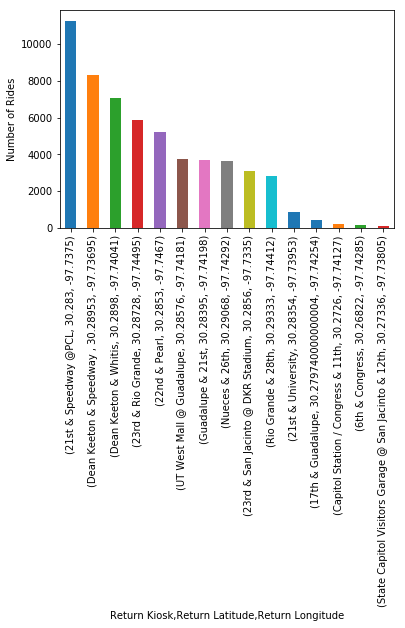

In [24]:
PCLgroup = df_PCL.groupby(['Return Kiosk', 'Return Latitude', 'Return Longitude']).count()['Trip ID'].sort_values(ascending=False)
PCLgroup = PCLgroup.iloc[0:15]
PCLgroup.plot('bar')
plt.ylabel('Number of Rides')
plt.show()

In [25]:
df_PCLb = df.loc[(df['Checkout Kiosk'] == '21st & Speedway @PCL') & (df['Return Kiosk'] == '21st & Speedway @PCL')]
df_PCLb.head()

,Trip ID,Membership Type,Bicycle ID,Checkout Kiosk ID,Checkout Kiosk,Return Kiosk ID,Return Kiosk,Trip Duration Minutes,Checkout DateTime,Checkout Latitude,Checkout Longitude,Return Latitude,Return Longitude,Checkout YR-MO
944990,16662171,Local30,341.0,3798.0,21st & Speedway @PCL,3798.0,21st & Speedway @PCL,15,2018-02-05 16:29:24,30.283,-97.7375,30.283,-97.7375,2018-02-01
944991,16669794,Annual,1932.0,3798.0,21st & Speedway @PCL,3798.0,21st & Speedway @PCL,22,2018-02-08 12:11:36,30.283,-97.7375,30.283,-97.7375,2018-02-01
944992,16674895,U.T. Student Membership,924.0,3798.0,21st & Speedway @PCL,3798.0,21st & Speedway @PCL,5,2018-02-09 16:30:29,30.283,-97.7375,30.283,-97.7375,2018-02-01
944993,16675784,U.T. Student Membership,288.0,3798.0,21st & Speedway @PCL,3798.0,21st & Speedway @PCL,7,2018-02-09 22:10:17,30.283,-97.7375,30.283,-97.7375,2018-02-01
944994,16675955,U.T. Student Membership,236.0,3798.0,21st & Speedway @PCL,3798.0,21st & Speedway @PCL,26,2018-02-10 01:49:51,30.283,-97.7375,30.283,-97.7375,2018-02-01


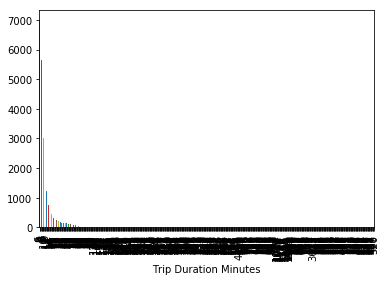

In [26]:
PCLbgroup = df_PCL.groupby(['Trip Duration Minutes']).count()['Trip ID'].sort_values(ascending=False)
PCLbgroup.plot('bar')

# Popular Bike Times

In [27]:
# Convert the checkout datetime from string to an actual date-time object.
df_time = df.copy()
df_time['Checkout DateTime'] = pd.to_datetime(df['Checkout DateTime'])
df_time['Checkout DateTime'] = [d.time() for d in df['Checkout DateTime']]
df_time = df_time.loc[df_time['Membership Type'] == 'U.T. Student Membership']

In [28]:
# All the cycles checked out in the same month are in the same group
tgroups = df_time.groupby(['Checkout DateTime']).count()['Trip ID']

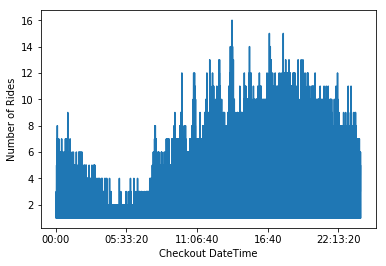

In [29]:
# Number of rides per month
tgroups.plot()
plt.ylabel('Number of Rides')
plt.show()

# Popular Destination By Time


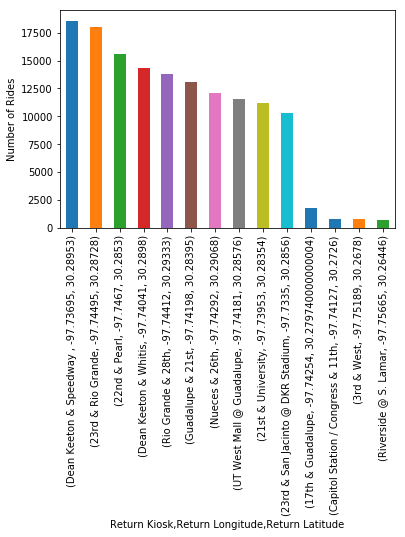

In [30]:
import datetime
datetime_object = datetime.datetime.strptime('05:00', '%H:%M').time()
df_time_d = df_time.loc[df_time['Checkout DateTime'] < datetime_object]
dgroups = df_time.groupby(['Return Kiosk', 'Return Longitude', 'Return Latitude']).count()['Trip ID'].sort_values(ascending = False)
dgroups = dgroups.iloc[1:15]
dgroups.plot('bar')
plt.ylabel('Number of Rides')
plt.show()

In [31]:
sumLong = 0
sumLat = 0

for i in range(len(dgroups)):
    sumLong=sumLong + dgroups.index[i][1]
    sumLat=sumLat + dgroups.index[i][2]

meanLong = sumLong/len(dgroups)
meanLat = sumLat/len(dgroups)

m = folium.Map(
    location=[meanLat,meanLong],
    zoom_start=14,
)

for i in range(len(dgroups)):
    markerRadius = dgroups.values[i] / 1000
    folium.CircleMarker([dgroups.index[i][2], dgroups.index[i][1]], radius = markerRadius, color='#3186cc',
    fill=True, fill_color='#3186cc', tooltip = dgroups.index[i][0]).add_to(m)
    folium.Circle([dgroups.index[i][2], dgroups.index[i][1]], radius = 20, color='red',
    fill=True, tooltip = dgroups.index[i][0]).add_to(m)
m

# Trajectory of Aggregate Memberships

In [39]:
# Get all trajectories for checkout year/month 2014 october
df_UT = df[df['Membership Type'] == 'U.T. Student Membership']
df_UT.reset_index(inplace=True)
df_UT.head()
#df_other = df[df['Membership Type'] != 'U.T. Student Membership']
#df_other.reset_index(inplace=True)
df_Local365 = df[df['Membership Type'] == 'Local365']
df_Local365.reset_index(inplace=True)
df_Annual = df[df['Membership Type'] == 'Annual Membership (Austin B-cycle)']
df_Annual.reset_index(inplace=True)

df_Kiosk = df[df['Membership Type'] == '24-Hour Kiosk']
df_Kiosk.reset_index(inplace=True)

df_WalkUp = df[df['Membership Type'] == 'Walk Up']
df_WalkUp.reset_index(inplace=True)

df_Pay1 = df[df['Membership Type'] == '$1 Pay by Trip Fall Special']
df_Pay1.reset_index(inplace=True)

In [40]:
# For checkout at a particular kiosk, how many trips to other kiosk?
df_countsUT = df_UT.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']
df_countsUT.head()
#df_countsOther = df_other.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']
df_countsLocal365 = df_Local365.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']
df_countsAnnual = df_Annual.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']
df_countsKiosk = df_Kiosk.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']
df_countsWalkUp = df_WalkUp.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']
df_countsPay1 = df_Pay1.groupby(['Checkout Latitude', 'Checkout Longitude', 'Return Latitude', 'Return Longitude']).count()['Trip ID']

In [43]:
m = folium.Map(
    location=[df_kiosks['Checkout Latitude'].mean(),df_kiosks['Checkout Longitude'].mean()],
    zoom_start=14,
    tiles='Stamen Terrain'
)

for i in range(len(df_countsUT)): 
    start_lat, start_lon, end_lat, end_lon = df_countsUT.index[i] 
    folium.PolyLine([(start_lat, start_lon),
                    (end_lat,end_lon)], color="orange", weight=2.5, opacity=4*df_countsUT[i]/df_countsUT.max()).add_to(m)
m

#for i in range(len(df_countsOther)):  
#    start_lat, start_lon, end_lat, end_lon = df_countsOther.index[i]
#    folium.PolyLine([(start_lat, start_lon),
#                    (end_lat,end_lon)], color="blue", weight=2.5, opacity=df_countsOther[i]/df_countsOther.max()).add_to(m)
#m

for i in range(len(df_countsLocal365)): 
    start_lat, start_lon, end_lat, end_lon = df_countsLocal365.index[i] 
    folium.PolyLine([(start_lat, start_lon), 
                   (end_lat,end_lon)], color="green", weight=2.5, opacity=2*df_countsLocal365[i]/df_countsLocal365.max()).add_to(m)
m

for i in range(len(df_countsAnnual)):  
    start_lat, start_lon, end_lat, end_lon = df_countsAnnual.index[i]
    folium.PolyLine([(start_lat, start_lon),
                   (end_lat,end_lon)], color="blue", weight=2.5, opacity=2*df_countsAnnual[i]/df_countsAnnual.max()).add_to(m)
m

for i in range(len(df_countsKiosk)):  
    start_lat, start_lon, end_lat, end_lon = df_countsKiosk.index[i]
    folium.PolyLine([(start_lat, start_lon),
                    (end_lat,end_lon)], color="purple", weight=2.5, opacity=2*df_countsKiosk[i]/df_countsKiosk.max()).add_to(m)
m

for i in range(len(df_countsWalkUp)):  
    start_lat, start_lon, end_lat, end_lon = df_countsWalkUp.index[i]
    folium.PolyLine([(start_lat, start_lon),
                    (end_lat,end_lon)], color="red", weight=2.5, opacity=2*df_countsWalkUp[i]/df_countsWalkUp.max()).add_to(m)
m

for i in range(len(df_countsPay1)):  
    start_lat, start_lon, end_lat, end_lon = df_countsPay1.index[i]
    folium.PolyLine([(start_lat, start_lon),
                    (end_lat,end_lon)], color="black", weight=2.5, opacity=2*df_countsPay1[i]/df_countsPay1.max()).add_to(m)
m
